# Course Project Part 1
More and more frequently summers in the western US have been characterized by wildfires with smoke billowing across multiple western states. There are many proposed causes for this: climate change, US Forestry policy, growing awareness, just to name a few. Regardless of the cause, the impact of wildland fires is widespread as wildfire smoke reduces the air quality of many cities. There is a growing body of work pointing to the negative impacts of smoke on health, tourism, property, and other aspects of society.

The course project will require that you analyze wildfire impacts on a specific city in the US. The end goal is to be able to inform policy makers, city managers, city councils, or other civic institutions, to make an informed plan for how they could or whether they should make plans to mitigate future impacts from wildfires.


## Step 0: Data Acquistion
The common analysis research question is based on one specific dataset. You should get the [Combined wildland fire datasets for the United States and certain territories, 1800s-Present (combined wildland fire polygons)](https://www.sciencebase.gov/catalog/item/61aa537dd34eb622f699df81) dataset. This dataset was collected and aggregated by the US Geological Survey. The dataset is relatively well documented. The dataset provides fire polygons in ArcGIS and GeoJSON formats. 

In this notebook, I will be analyzing wildfires and their smoke impact on [Gresham, OR](https://en.wikipedia.org/wiki/Gresham,_Oregon).

## Dr. McDonald's Wildfire Proximity Computation Example
The following cells contains example code that illustrate how to perform some basic geodetic computations related to the Wildfire course project. The example is structured as a set of examples that illustrate something about the the data schema or illustrate a way to compute specific values. This notebook is not a tutorial on performing geodetic computations, but illustrates a number of key concepts. This notebook should provide enough information to complete the Wildfire assignment.

The complete [Wildfire dataset](https://www.sciencebase.gov/catalog/item/61aa537dd34eb622f699df81) can be retrieved from a US government repository. I have noticed that the repository is sometimes "down" and does not respond. It probably makes sense to get the dataset as soon as possible.

This example has dependencies on [Pyproj](https://pyproj4.github.io/pyproj/stable/index.html), the [geojson](https://pypi.org/project/geojson/) module and on the wildfire user module. Pyproj and geojson can be installed via pip. The wildfire user module should be downloaded from the course website, unzipped, and moved into the folder pointed to by your PYTHONPATH system variable.

### License
This code example was developed by Dr. David W. McDonald for use in DATA 512, a course in the UW MS Data Science degree program. This code is provided under the [Creative Commons](https://creativecommons.org) [CC-BY license](https://creativecommons.org/licenses/by/4.0/). Revision 1.1 - August 16, 2024

In [242]:
#
#    IMPORTS
# 

#    Import some standard python modules
import os, json, time
#
#    The module pyproj is a standard module that can be installed using pip or your other favorite
#    installation tool. This module provides tools to convert between different geodesic coordinate systems
#    and for calculating distances between points (coordinates) in a specific geodesic system.
#
from pyproj import Transformer, Geod
#
#    The 'wildfire' module is a user module. This module is available from the course website. The module
#    includes one object, a Reader, that can be used to read the GeoJSON files associated with the
#    wildefire dataset. The module also contains a sample datafile that is GeoJSON compliant and that
#    contains a small number of wildfires extracted from the main wildfire dataset.
#    
from wildfire.Reader import Reader as WFReader
#
#    There is a GeoJSON reader that you might try if you wanted to read the data. It has its own quirks.
#    There will be an example below that reads the sample file "Wildfire_short_sample.json"
#    
import geojson
import pandas as pd
import matplotlib.pyplot as plt
import requests
import pandas as pd
import numpy as np
import re
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.arima.model import ARIMA

# 
#    These are standard python modules
#

## Load the wildfire data using the GeoJSON module
In this example we use the GeoJSON module ([documentation](https://pypi.org/project/geojson/), [GitHub repo](https://github.com/jazzband/geojson)) to load the data. This module works mostly the way you would expect. GeoJSON is mostly just JSON, so actually, you don't even really need to use the GeoJSON module. However, that module will do some conversion of Geo type things to something useful. However, this example, and the examples that follow, do not rely on specific Geo features from geojson.

In [243]:
# Define your city coordinates for Gresham, OR
CITY_LOCATIONS = {
    'gresham': {'city': 'Gresham', 'latlon': [45.5045, -122.4357]}
}
place = CITY_LOCATIONS["gresham"]

# Open the GeoJSON file using the custom Reader class
filename = "/Users/sarahnguyen/Documents/HCD/data-512-course-project-part_1/wildfire/USGS_Wildland_Fire_Combined_Dataset.json"
reader = WFReader()

try:
    print(f"Attempting to open '{filename}'")
    reader.open(filename)
    print(f"File '{filename}' opened successfully")
except Exception as e:
    print(f"Failed to open file: {str(e)}")
    raise

Attempting to open '/Users/sarahnguyen/Documents/HCD/data-512-course-project-part_1/wildfire/USGS_Wildland_Fire_Combined_Dataset.json'
File '/Users/sarahnguyen/Documents/HCD/data-512-course-project-part_1/wildfire/USGS_Wildland_Fire_Combined_Dataset.json' opened successfully


### Convert points between geodetic coordinate systems
#### Inspired by  Dr. McDonald's code but modified to add error handling and caching
This code was inspired by Dr. McDonald's code in `wildfire_geo_proximity_example.ipynb` example 4. Parts that were modified to be more robust to errors were noted in the comments.

**Purpose of Converting Points** : One of the constraints in doing geodetic computations is that most of the time we need to have our points (the coordinates for places) in the same geographic coordinate system. There are tons and tons of coordinate systems. You can find descriptions of many of them at [EPSG.io](https://epsg.io).

Looking at the wildfire header information, you can find this in the output of Example 1 (above), we can see fields named "geometryType" and "spatialReference". This looks like:

        "geometryType": "esriGeometryPolygon",
        "spatialReference": {
            "wkid": 102008,
            "latestWkid": 102008
        },

This indicates that the geometry of our wildfire data are generic polygons and that they are expressed in a coordinate system with the well-known ID (WKID) 102008. This coordinate system is also known as [ESRI:102008](https://epsg.io/102008)

For the example below, what we're going to do is take the geometry of a fire feature, extract the largest ring (i.e., the largest boundary of the fire) and convert all of the points in that ring from the ESRI:102008 coordinate system to EPSG:4326 coordinates.

Why? You might ask. Well, it turns out that the easy way to get locations for a city is to make a Google query for the location. That will respond with a decimal degress version of latitued and longitude. So, this allows us to move everything into decimal degress before we perform a distance calcluation.

In [244]:
transformed_ring_cache = {}

def convert_ring_to_epsg4326(ring_data=None):
    if ring_data is None or len(ring_data) == 0:
        return None

    # convert list to hashable tuple for easy access
    ring_key = tuple(map(tuple, ring_data))  
    if ring_key in transformed_ring_cache:
        return transformed_ring_cache[ring_key]

    # DR.MCDONALDS ORIGINAL CODE:
    converted_ring = []
    # We use a pyproj transformer that converts from ESRI:102008 to EPSG:4326 to transform the list of coordinates
    to_epsg4326 = Transformer.from_crs("ESRI:102008", "EPSG:4326")

    # We'll run through the list transforming each ESRI:102008 x,y coordinate into a decimal degree lat,lon
    # added error handling to skip coordinates not put in correctly
    for coord in ring_data:
        if len(coord) != 2: # Modified by me to skip malformed coordinates
            continue  
        lat, lon = to_epsg4326.transform(coord[0], coord[1]) # back to OG code
        converted_ring.append((lat, lon))

    # Modified by me, adding caching for efficiency & returns none if no valid transofrmations
    if len(converted_ring) > 0:
        transformed_ring_cache[ring_key] = converted_ring
        return converted_ring
    else:
        return None

# Step 1: Create Fire Smoke Estimates
Our goal is to find what are the estimated wildfire smoke impacts on your assigned city each year for the most recent 60 years of wildfire data? 

I will find this by creating:
 - A number to represent an estimate of the smoke seen by city during each annual fire season called the `wildfire smoke impact`
- A predictive model of smoke impact 

#### Dr. McDonald's Example Code: Compute distance between a place and a wildfire
The following code block is Dr. McDonald's code from `wildfire_geo_proximity_example.ipynb`.

The basic problem is knowing how far away a fire is from some location (like a city). One issue is that fires are irregularly shaped so the actual answer to that is a bit dependent upon the exact shape and how you want to think about the notion of 'distance'. For example, should we just find the closest point on the perimiter of a fire and call that the distance? Maybe we should find the centroid of the region, identify that as a geolocation (coordinate) and then calculate the distance to that? We can come up with numerous other ways.

The first bit of code finds the point on the perimiter with the shortest distance to the city (place) and returns the distance as well as the lat,lon of the perimeter point.

The second bit of code calculates the average distance of all perimeter points to the city (place) and returns that average as the distance. This is not quite what the centroid would be, but it is probably fairly close.

These are two reasonable ways to think about possible distance to a fire. But both require computing distance to a whole set of points on the perimeter of a fire.


In [245]:
#    
#    The function takes two parameters
#        A place - which is coordinate point (list or tuple with two items, (lat,lon) in decimal degrees EPSG:4326
#        Ring_data - a list of decimal degree coordinates for the fire boundary
#
#    The function returns a list containing the shortest distance to the perimeter and the point where that is
#
def shortest_distance_from_place_to_fire_perimeter(place=None,ring_data=None):
    # convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # create a epsg4326 compliant object - which is what the WGS84 ellipsoid is
    geodcalc = Geod(ellps='WGS84')
    closest_point = list()
    # run through each point in the converted ring data
    for point in ring:
        # calculate the distance
        d = geodcalc.inv(place[1],place[0],point[1],point[0])
        # convert the distance to miles
        distance_in_miles = d[2]*0.00062137
        # if it's closer to the city than the point we have, save it
        if not closest_point:
            closest_point.append(distance_in_miles)
            closest_point.append(point)
        elif closest_point and closest_point[0]>distance_in_miles:
            closest_point = list()
            closest_point.append(distance_in_miles)
            closest_point.append(point)
    return closest_point



#    
#    The function takes two parameters
#        A place - which is coordinate point (list or tuple with two items, (lat,lon) in decimal degrees EPSG:4326
#        Ring_data - a list of decimal degree coordinates for the fire boundary
#
#    The function returns the average miles from boundary to the place
#
def average_distance_from_place_to_fire_perimeter(place=None,ring_data=None):
    # convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # create a epsg4326 compliant object - which is what the WGS84 ellipsoid is
    geodcalc = Geod(ellps='WGS84')
    # create a list to store our results
    distances_in_meters = list()
    # run through each point in the converted ring data
    for point in ring:
        # calculate the distance
        d = geodcalc.inv(place[1],place[0],point[1],point[0])
        distances_in_meters.append(d[2])
    #print("Got the following list:",distances_in_meters)
    # convert meters to miles
    distances_in_miles = [meters*0.00062137 for meters in distances_in_meters]
    # the esri polygon shape (the ring) requires that the first and last coordinates be identical to 'close the region
    # we remove one of them so that we don't bias our average by having two of the same point
    distances_in_miles_no_dup = distances_in_miles[1:]
    # now, average miles
    average = sum(distances_in_miles_no_dup)/len(distances_in_miles_no_dup)
    return average

## Filtering the Data

Now, I must filter the data to get the smoke estimate according to the required parameters.

My wildfire `smoke impact` estimate will adhere to the following:
- The estimate only considers the last 60 years of wildland fire data (1961-2021).
- The estimate only considers fires that are within 650 miles of your assigned city.
- Defines the annual fire season as running from May 1st through October 31st.

The following code filters the data based on these criteria:

1. **Date Validation**: The `extract_valid_date` function attempts to parse a date from the fire data. If a valid date in the format `YYYY-MM-DD` is found, it returns a `datetime` object; otherwise, it handles errors gracefully.
2. **Fire Season and Year Validation**: The `is_valid_fire_year_and_season` function filters out fires that don't fall within the defined 60-year range (1961-2021) or that don't occur during the annual fire season (May 1st through October 31st).
3. **Distance Validation**: The `is_within_max_distance` function ensures that only fires within 650 miles of the assigned city are included. If a fire's distance is beyond this limit, it is excluded from the analysis.



In [246]:
# helper function to validate fire date
def extract_valid_date(fire_date_str):
    try:
        match = re.search(r'\d{4}-\d{2}-\d{2}', fire_date_str)
        if match:
            fire_date = datetime.strptime(match.group(0), "%Y-%m-%d")
            return fire_date
    except Exception as e:
        print(f"Error extracting date from: {fire_date_str} -> {str(e)}")
    return None

# filter fires based on the last 60 years and fire season
def is_valid_fire_year_and_season(fire_year, fire_date_str):
    if not (1961 <= fire_year <= 2021):
        return False

    fire_date = extract_valid_date(fire_date_str)
    if fire_date and datetime(fire_date.year, 5, 1) <= fire_date <= datetime(fire_date.year, 10, 31):
        return True
    return False

# filter fires based on distance (e.g., skip if too far from Gresham)
def is_within_max_distance(place=None, ring_data=None, max_distance_miles=1800):
    distance, _ = shortest_distance_from_place_to_fire_perimeter(place, ring_data)
    if np.isnan(distance):
        return False
    return distance <= max_distance_miles

## Efficient Batch Processing of Wildfire Data

To efficiently handle the large wildfire dataset, I am processing the data in manageable batches. Batching improves memory usage and speeds up processing by handling only a subset of the data at a time. Below is a breakdown of how each component works in the batch processing:

1. **Batch Processing Function (`process_data_in_batches`)**:
    - This function reads and filters wildfire data in batches.
    - For each feature (wildfire event), it:
        - Checks if the event year and season fall within the valid range (using `is_valid_fire_year_and_season`).
        - Validates the geometry data to ensure it can calculate the distance to the target city.
        - Filters based on the distance to the city to keep only events within the specified range.
    - The `process_batch` function is called once a batch reaches the specified size (`batch_size`), ensuring efficient memory management.
    - After the loop, any remaining features in the batch are processed.

2. **Smoke Impact Calculation (`calculate_smoke_impact`)**:
    - This function calculates the smoke impact of each wildfire event based on its size (in acres) and its distance from the target city.
    - To avoid division by zero errors, it assigns a high impact to fires extremely close to the city.

3. **Batch Processing Helper (`process_batch`)**:
    - This function iterates through each wildfire event in the batch, calculates the smoke impact, and stores relevant data.
    - Key steps include:
        - Ensuring each feature has a `Fire_Year` value, skipping any missing this data.
        - Calculating the shortest distance between the wildfire perimeter and the target city, and skipping any events without valid geometry.
        - Adding the smoke impact and other details to the `smoke_impact_data` list for further analysis.

This allows for an efficient workflow, where data is filtered, processed, and stored incrementally without overloading system memory.

In [247]:
def process_data_in_batches(reader, batch_size=100, max_distance=None):
    batch = []
    feature_count = 0
    error_count = 0
    total_features = 0
    
    while True:
        try:
            feature = reader.next()  # Get the next feature
            if feature:
                wf_year = feature['attributes'].get('Fire_Year', 'Unknown')
                fire_date_str = feature['attributes'].get('Listed_Fire_Dates', '')

                # Early filtering by year and fire season
                if not is_valid_fire_year_and_season(wf_year, fire_date_str):
                    continue

                if 'rings' in feature['geometry']:
                    ring_data = feature['geometry']['rings'][0]
                elif 'curveRings' in feature['geometry']:
                    ring_data = feature['geometry']['curveRings'][0]
                else:
                    continue  # Skip if no valid geometry

                # Early filtering by distance to Gresham
                if not is_within_max_distance(place['latlon'], ring_data, max_distance):
                    continue

                # Append to batch only if both filters pass
                batch.append(feature)
                feature_count += 1
                total_features += 1

                if len(batch) >= batch_size:
                    process_batch(batch)
                    batch.clear()  # Clear the batch after processing
            else:
                break  # End of file

        except Exception as e:
            error_count += 1
            print(f"Error reading feature: {str(e)}")
            break

    # Process any remaining features in the last batch
    if len(batch) > 0:
        process_batch(batch)

    print(f"Finished processing {feature_count} wildfire features.")
    print(f"Total errors: {error_count}")
    print(f"Total features processed: {total_features}")

# Define function to calculate smoke impact
def calculate_smoke_impact(acres, distance):
    # Avoid division by zero by assigning a high impact if the fire is very close
    return acres / (distance ** 2) if distance > 0 else float('inf')

# This will store each fire's data for easy access and analysis
smoke_impact_data = []
def process_batch(batch):
    for feature in batch:
        wf_year = feature['attributes'].get('Fire_Year', 'Unknown')
        wf_name = feature['attributes'].get('Listed_Fire_Names', 'Unnamed').split(',')[0]
        wf_size = feature['attributes'].get('GIS_Acres', 0.0)

        # Verify that 'Fire_Year' exists
        if wf_year == 'Unknown':
            print("Warning: 'Fire_Year' is missing for a feature.")
            continue  # Skip if 'Fire_Year' is missing

        # Handle geometry to ensure distance calculation
        if 'rings' in feature['geometry']:
            ring_data = feature['geometry']['rings'][0]
        elif 'curveRings' in feature['geometry']:
            ring_data = feature['geometry']['curveRings'][0]
        else:
            print("Warning: Skipped feature due to missing geometry data.")
            continue  # Skip if no compatible geometry

        # Calculate shortest distance
        distance, closest_point = shortest_distance_from_place_to_fire_perimeter(place['latlon'], ring_data)
        if np.isnan(distance):
            print("Warning: Distance calculation failed, skipping fire.")
            continue

        # Calculate smoke impact and add to smoke_impact_data
        smoke_impact = calculate_smoke_impact(wf_size, distance)
        fire_data = {
            "Year": wf_year,
            "Fire_Name": wf_name,
            "Fire_Size_Acres": wf_size,
            "Distance_to_City_Miles": distance,
            "Smoke_Impact": smoke_impact
        }
        smoke_impact_data.append(fire_data)
        print(f"Added fire data: {fire_data}")


## Distance Filtering

To meet the assignment requirements, I am applying two different distance filters to the wildfire data. 

1. **Distance Ranges and DataFrames**:
    - The assignment specifies that smoke estimates should only include fires within 650 miles of the assigned city. To ensure this, I created two separate dataframes:
        - `smoke_impact_df`: This dataframe includes all fires within a 0-1800 mile range, processed through the `process_data_in_batches` function with a maximum distance parameter of 1800 miles. This dataset is used primarily for visualizations (e.g., histogram showing fires up to 1800 miles).
        - `close_fires_df`: This dataframe contains only the fires within 650 miles of the assigned city and is derived by filtering `smoke_impact_df`. It forms the basis for calculating the `annual_smoke_impact` as required by the assignment for smoke impact estimates.

2. **Smoke Estimate Calculation**:
    - Smoke estimates are computed for each fire up to 1800 miles; however, only fires within 650 miles (contained in `close_fires_df`) contribute to the `annual_smoke_impact` calculation.
    - This ensures that while we analyze and visualize fires up to 1800 miles, the actual smoke impact estimate strictly adheres to the 650-mile constraint.

This setup allows us to maintain two datasets for different purposes—one for the 650-mile limit and another for the extended 1800-mile visualization requirement—providing flexibility in analysis and adherence to assignment specifications.


In [249]:
process_data_in_batches(reader, batch_size=100, max_distance=1800)

smoke_impact_df = pd.DataFrame(smoke_impact_data)

# Sort and clean the DataFrame for further analysis
smoke_impact_df["Year"] = smoke_impact_df["Year"].astype(int)  # Ensure year is an integer for sorting
smoke_impact_df = smoke_impact_df.sort_values(by=["Year", "Fire_Name"]).reset_index(drop=True)

smoke_impact_df.to_csv("smoke_impact_estimates1.csv", index=False)
print(smoke_impact_df)

Added fire data: {'Year': 1964, 'Fire_Name': 'COOKS (4)', 'Fire_Size_Acres': 500.93466390921964, 'Distance_to_City_Miles': 375.4476238588589, 'Smoke_Impact': 0.0035537131148703585}
Added fire data: {'Year': 1964, 'Fire_Name': 'WOOD-SCHAUBACH (5)', 'Fire_Size_Acres': 492.4160343959656, 'Distance_to_City_Miles': 597.2626312137013, 'Smoke_Impact': 0.00138038903194558}
Added fire data: {'Year': 1964, 'Fire_Name': 'DAVIES #2 (5)', 'Fire_Size_Acres': 488.9626785189616, 'Distance_to_City_Miles': 387.1103289014335, 'Smoke_Impact': 0.0032629182494460784}
Added fire data: {'Year': 1964, 'Fire_Name': 'PINE CANYON (5)', 'Fire_Size_Acres': 481.85547059585974, 'Distance_to_City_Miles': 617.0727276462226, 'Smoke_Impact': 0.001265447373497899}
Added fire data: {'Year': 1964, 'Fire_Name': 'SYCAMORE CANYON (5)', 'Fire_Size_Acres': 458.994728026723, 'Distance_to_City_Miles': 732.998797018336, 'Smoke_Impact': 0.0008542818382886392}
Added fire data: {'Year': 1964, 'Fire_Name': 'P.G.&E. #6 (5)', 'Fire_Size_

In [268]:
# dataframe for fires within 650, used for smoke estimate
close_fires_df = smoke_impact_df[smoke_impact_df['Distance_to_City_Miles'] <= 650]

close_fires_df.head()

,Year,Fire_Name,Fire_Size_Acres,Distance_to_City_Miles,Smoke_Impact
0,1961,4 MILE (4),1702.881869,306.363628,0.018143
1,1961,A. W. WALDO (5),470.326850,422.547385,0.002634
2,1961,AUBURN (10),1091.017064,461.659039,0.005119
3,1961,AUSTRIAN GULCH (5),9071.436292,576.427961,0.027301
4,1961,Alkali\n (2),0.745750,545.904870,0.000003


## Checking the Annual Smoke Impact
While this step wasn't explicitly required by the assignment, visualizing the annual smoke impact provides insights into the trends and fluctuations of wildfire smoke over time. By plotting `annual_smoke_impact`, we can observe any patterns in smoke impact, which could help in understanding historical fire trends, seasonality, or the effectiveness of fire management practices over the years.

The `annual_smoke_impact` variable is calculated by summing up the smoke impact values for all wildfires that occurred within 650 miles of Gresham, OR, for each year in the dataset. This annual sum provides a cumulative smoke impact measure, which can be visualized over time.

/var/folders/j_/vc3ydh9x0l3dty8vdsjkb0_80000gn/T/ipykernel_18679/2605122944.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  close_fires_df["Year"] = close_fires_df["Year"].astype(int)


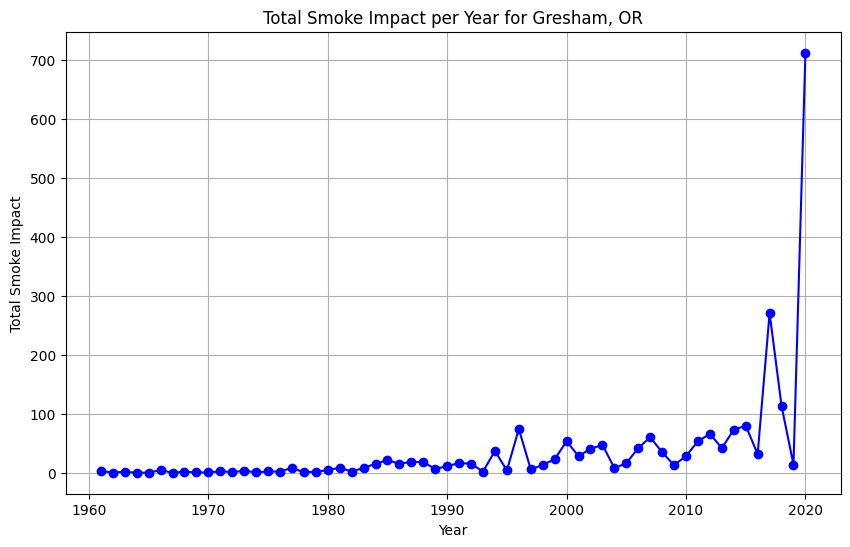

In [276]:
close_fires_df["Year"] = close_fires_df["Year"].astype(int)

# calculating the total smoke impact per year by summing impacts for each year
annual_smoke_impact = close_fires_df.groupby("Year")["Smoke_Impact"].sum().reset_index()

# smoke impact over years
plt.figure(figsize=(10, 6))
plt.plot(annual_smoke_impact["Year"], annual_smoke_impact["Smoke_Impact"], marker='o', linestyle='-', color='b', label = 'Smoke Impact')
plt.xlabel("Year")
plt.ylabel("Total Smoke Impact")
plt.title("Total Smoke Impact per Year for Gresham, OR")
plt.grid(True)
plt.show()


## Removing Outliers
Upon examining the visualization of the annual smoke impact, it’s clear that most data points fall close to zero, and typically do not exceed a smoke impact value of 100. However, there is a significant outlier in 2020, where the smoke impact reaches above 700. This spike is quite unusual, especially considering that even the highest impact values in other years rarely exceed 300.

To understand this anomaly, I investigated the wildfire responsible for the high smoke impact value in 2020. This led me to identify the [Riverside (2020)](https://site.oregonforests.org/sites/default/files/2021-11/Riverside-Summary-Sheet.pdf), which contributed approximately 510 smoke impact points to that year. Although this data point was not a result of an error, it stands out as an extreme event compared to historical trends.

Given its unusual magnitude, I decided to remove this outlier from the dataset to prevent it from disproportionately influencing trend analysis or model forecasts. However, I retained the second-highest data point from 2017, which, while high, is more in line with other data. Keeping this point allows the analysis to consider potential future occurrences of larger smoke impacts, while still reducing the distortion caused by an extreme outlier like the Riverside Fire.

In [269]:
smoke_impact_2020 = close_fires_df[close_fires_df['Year'] == 2020]

# find the highest contributer to the smoke impact in 2020
max_smoke_impact_2020 = smoke_impact_2020['Smoke_Impact'].max()

# take maximum smoke impact for 2020 out
max_smoke_impact_row_2020 = smoke_impact_2020[smoke_impact_2020['Smoke_Impact'] == max_smoke_impact_2020]
modified_smoke_impact_df = smoke_impact_df[~((smoke_impact_df["Year"] == 2020) & (smoke_impact_df["Smoke_Impact"] == max_smoke_impact_2020))]

print("Maximum Smoke Impact for 2020:")
print(max_smoke_impact_row_2020)

Maximum Smoke Impact for 2020:
       Year      Fire_Name  Fire_Size_Acres  Distance_to_City_Miles  \
59839  2020  Riverside (4)    138151.468001               16.444709   

       Smoke_Impact  
59839    510.861464  


In [254]:
# annual data with single outlier removed
modified_smoke_impact_df

,Year,Fire_Name,Fire_Size_Acres,Distance_to_City_Miles,Smoke_Impact
0,1961,4 MILE (4),1702.881869,306.363628,1.814304e-02
1,1961,A. W. WALDO (5),470.326850,422.547385,2.634201e-03
2,1961,AUBURN (10),1091.017064,461.659039,5.119044e-03
3,1961,AUSTRIAN GULCH (5),9071.436292,576.427961,2.730147e-02
4,1961,Alkali\n (2),0.745750,545.904870,2.502416e-06
...,...,...,...,...,...
60601,2020,lookout fire (1),0.008460,88.386240,1.082953e-06
60602,2020,ok a beh (1),17.582442,705.561444,3.531909e-05
60603,2020,peacock (1),1.850907,1787.591177,5.792261e-07
60604,2020,rainbow (1),0.734544,994.325581,7.429516e-07


/var/folders/j_/vc3ydh9x0l3dty8vdsjkb0_80000gn/T/ipykernel_18679/243761515.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  modified_smoke_impact_df["Year"] = modified_smoke_impact_df["Year"].astype(int)


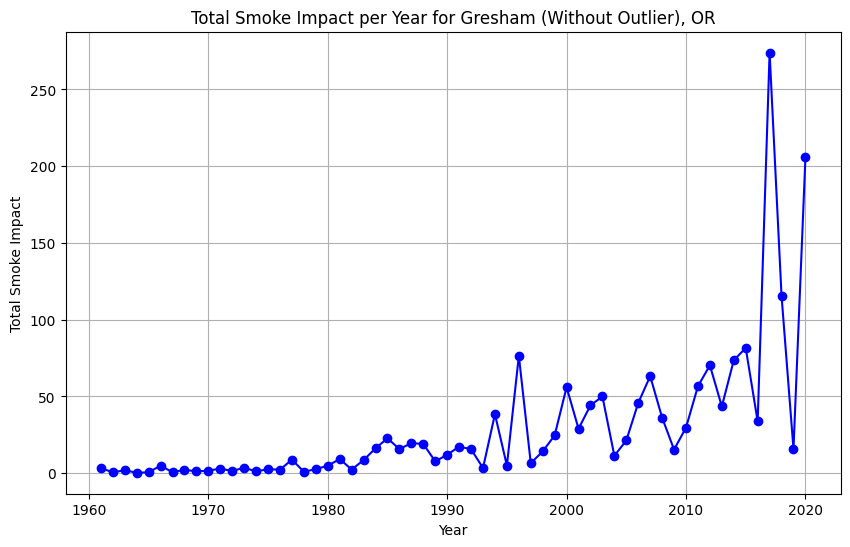

In [275]:
# Rerunning without outlier
modified_smoke_impact_df["Year"] = modified_smoke_impact_df["Year"].astype(int)
annual_smoke_impact1 = modified_smoke_impact_df.groupby("Year")["Smoke_Impact"].sum().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(annual_smoke_impact1["Year"], annual_smoke_impact1["Smoke_Impact"], marker='o', linestyle='-', color='b', label = 'Smoke Impact')
plt.xlabel("Year")
plt.ylabel("Total Smoke Impact")
plt.title("Total Smoke Impact per Year for Gresham (Without Outlier), OR")
plt.grid(True)
plt.show()


# Calculate AQI - US EPA Air Quality System API Example
This example illustrates how to request data from the US Environmental Protection Agency (EPA) Air Quality Service (AQS) API. This is a historical API and does not provide real-time air quality data. The [documentation](https://aqs.epa.gov/aqsweb/documents/data_api.html) for the API provides definitions of the different call parameter and examples of the various calls that can be made to the API.

This notebook works systematically through example calls, requesting an API key, using 'list' to get various IDs and parameter values, and using 'daily summary' to get summary data that meets specific condistions. The notebook contains example function definitions that could be reused in other code. In general, the notebook explains each step along the way, referring back to possible output. Some of the explanations are tailored to the specific example requests of the API. Changing values to explore the results of the API is probably useful, but that will result in some explanations being out of sync with the outputs.

The US EPA was created in the early 1970's. The EPA reports that they only started broad based monitoring with standardized quality assurance procedures in the 1980's. Many counties will have data starting somewhere between 1983 and 1988. However, some counties still do not have any air quality monitoring stations. The API helps resolve this by providing calls to search for monitoring stations and data using either station ids, or a county designation or a geographic bounding box. This example code provides examples of the county based and bounding box based API calls. Some [additional information on the Air Quality System can be found in the EPA FAQ](https://www.epa.gov/outdoor-air-quality-data/frequent-questions-about-airdata) on the system.

The end goal of this example is to get to some values that we might use for the Air Quality Index or AQI. You might see this reported on the news, most often around smog, but more frequently with regard to smoke. The AQI index is meant to tell us something about how healthy or clean the air is on any day. The AQI is actually a somewhat complext measure. When I started this example I looked up [how to calculate the AQI](https://www.airnow.gov/sites/default/files/2020-05/aqi-technical-assistance-document-sept2018.pdf) so that I would know roughly what goes into that value.


## License
This code example was developed by Dr. David W. McDonald for use in DATA 512, a course in the UW MS Data Science degree program. This code is provided under the [Creative Commons](https://creativecommons.org) [CC-BY license](https://creativecommons.org/licenses/by/4.0/). Revision 1.2 - August 16, 2024



In [185]:
USERNAME = "sarwin@uw.edu"
APIKEY = "tealmouse98"

In [186]:
#########
#
#    CONSTANTS
#

#
#    This is the root of all AQS API URLs
#
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'

#
#    These are some of the 'actions' we can ask the API to take or requests that we can make of the API
#
#    Sign-up request - generally only performed once - unless you lose your key
API_ACTION_SIGNUP = '/signup?email={email}'
#
#    List actions provide information on API parameter values that are required by some other actions/requests
API_ACTION_LIST_CLASSES = '/list/classes?email={email}&key={key}'
API_ACTION_LIST_PARAMS = '/list/parametersByClass?email={email}&key={key}&pc={pclass}'
API_ACTION_LIST_SITES = '/list/sitesByCounty?email={email}&key={key}&state={state}&county={county}'
#
#    Monitor actions are requests for monitoring stations that meet specific criteria
API_ACTION_MONITORS_COUNTY = '/monitors/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_MONITORS_BOX = '/monitors/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    Summary actions are requests for summary data. These are for daily summaries
API_ACTION_DAILY_SUMMARY_COUNTY = '/dailyData/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_DAILY_SUMMARY_BOX = '/dailyData/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    It is always nice to be respectful of a free data resource.
#    We're going to observe a 100 requests per minute limit - which is fairly nice
API_LATENCY_ASSUMED = 0.002       # Assuming roughly 2ms latency on the API and network
API_THROTTLE_WAIT = (1.0/100.0)-API_LATENCY_ASSUMED
#
#
#    This is a template that covers most of the parameters for the actions we might take, from the set of actions
#    above. In the examples below, most of the time parameters can either be supplied as individual values to a
#    function - or they can be set in a copy of the template and passed in with the template.
# 
AQS_REQUEST_TEMPLATE = {
    "email":      "",     
    "key":        "",      
    "state":      "",     # the two digit state FIPS # as a string
    "county":     "",     # the three digit county FIPS # as a string
    "begin_date": "",     # the start of a time window in YYYYMMDD format
    "end_date":   "",     # the end of a time window in YYYYMMDD format, begin_date and end_date must be in the same year
    "minlat":    0.0,
    "maxlat":    0.0,
    "minlon":    0.0,
    "maxlon":    0.0,
    "param":     "",     # a list of comma separated 5 digit codes, max 5 codes requested
    "pclass":    ""      # parameter class is only used by the List calls
}



# Making a list request
This code example was developed by Dr. David W. McDonald for use in DATA 512, a course in the UW MS Data Science degree program in `epa_air_quality_history_example.ipynb`

Once you have a key, the next thing is to get information about the different types of air quality monitoring (sensors) and the different places where we might find air quality stations. The monitoring system is complex and changes all the time. The EPA implementation allows an API user to find changes to monitoring sites and sensors by making requests - maybe monthly, or daily. This API approach is probably better than having the EPA publish documentation that may be out of date as soon as it hits a web page. The one problem here is that some of the responses rely on jargon or terms-of-art. That is, one needs to know a bit about the way atmospheric sciece works to understand some of the terms. ... Good thing we can use the web to search for terms we don't know!

In [187]:
#
#    This implements the list request. There are several versions of the list request that only require email and key.
#    This code sets the default action/requests to list the groups or parameter class descriptors. Having those descriptors 
#    allows one to request the individual (proprietary) 5 digit codes for individual air quality measures by using the
#    param request. Some code in later cells will illustrate those requests.
#
def request_list_info(email_address = None, key = None,
                      endpoint_url = API_REQUEST_URL, 
                      endpoint_action = API_ACTION_LIST_CLASSES, 
                      request_template = AQS_REQUEST_TEMPLATE,
                      headers = None):
    
    #  Make sure we have email and key - at least
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    
    # For the basic request we need an email address and a key
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_list_info()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_list_info()'")

    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

This code example was developed by Dr. David W. McDonald for use in DATA 512, a course in the UW MS Data Science degree program in `epa_air_quality_history_example.ipynb`

We're interested in getting to something that might be the Air Quality Index (AQI). You see this reported on the news - often around smog values, but also when there is smoke in the sky. The AQI is a complex measure of different gasses and of the particles in the air (dust, dirt, ash ...).

From the list produced by our 'list/Classes' request above, it looks like there is a class of sensors called "AQI POLLUTANTS". Let's try to get a list of those specific sensors and see what we can get from those.

In [188]:
#
#   Once we have a list of the classes or groups of possible sensors, we can find the sensor IDs that make up that class (group)
#   The one that looks to be associated with the Air Quality Index is "AQI POLLUTANTS"
#   We'll use that to make another list request.
#
AQI_PARAM_CLASS = "AQI POLLUTANTS"


In [189]:
#
#   Structure a request to get the sensor IDs associated with the AQI
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['pclass'] = AQI_PARAM_CLASS  # here we specify that we want this 'pclass' or parameter classs

response = request_list_info(request_template=request_data, endpoint_action=API_ACTION_LIST_PARAMS)

if response["Header"][0]['status'] == "Success":
    print(json.dumps(response['Data'],indent=4))
else:
    print(json.dumps(response,indent=4))


[
    {
        "code": "42101",
        "value_represented": "Carbon monoxide"
    },
    {
        "code": "42401",
        "value_represented": "Sulfur dioxide"
    },
    {
        "code": "42602",
        "value_represented": "Nitrogen dioxide (NO2)"
    },
    {
        "code": "44201",
        "value_represented": "Ozone"
    },
    {
        "code": "81102",
        "value_represented": "PM10 Total 0-10um STP"
    },
    {
        "code": "88101",
        "value_represented": "PM2.5 - Local Conditions"
    },
    {
        "code": "88502",
        "value_represented": "Acceptable PM2.5 AQI & Speciation Mass"
    }
]


We should now have (above) a response containing a set of sensor ID numbers. The list should include the sensor numbers as well as a description or name for each sensor. 

The EPA AQS API has limits on some call parameters. Specifically, when we request data for sensors we can only specify a maximum of 5 different sensor values to return. This means we cannot get all of the Air Quality Index parameters in one request for data. We have to break it up.

What I did below was to break the request into two logical groups, the AQI sensors that sample gasses and the AQI sensors that sample particles in the air.

In [190]:
#
#   Given the set of sensor codes, now we can create a parameter list or 'param' value as defined by the AQS API spec.
#   It turns out that we want all of these measures for AQI, but we need to have two different param constants to get
#   all seven of the code types. We can only have a max of 5 sensors/values request per param.
#
#   Gaseous AQI pollutants CO, SO2, NO2, and O2
AQI_PARAMS_GASEOUS = "42101,42401,42602,44201"
#
#   Particulate AQI pollutants PM10, PM2.5, and Acceptable PM2.5
AQI_PARAMS_PARTICULATES = "81102,88101,88502"
#   
#

In [191]:
#
#
# MODIFIED TO MY ASSIGNED CITY
CITY_LOCATIONS = {
    'gresham' :     {'city'   : 'Gresham',
                       'county' : 'Clatsop',
                       'state'  : 'Oregon',
                       'fips'   : '41051',
                       'latlon' : [45.5045, 122.4357] }
}


Given our CITY_LOCATIONS (modified to my assigned city) constant we can now find which monitoring locations are nearby. One option is to use the county to define the area we're interest in. You can get the EPA to list their monitoring stations by county.

In [192]:
#
#  This list request should give us a list of all the monitoring stations in the county specified by the
#  given city selected from the CITY_LOCATIONS dictionary
#
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY 
request_data['state'] = CITY_LOCATIONS['gresham']['fips'][:2]   # the first two digits (characters) of FIPS is the state code
request_data['county'] = CITY_LOCATIONS['gresham']['fips'][2:]  # the last three digits (characters) of FIPS is the county code

response = request_list_info(request_template=request_data, endpoint_action=API_ACTION_LIST_SITES)

if response["Header"][0]['status'] == "Success":
    print(json.dumps(response['Data'],indent=4))
else:
    print(json.dumps(response,indent=4))


[
    {
        "code": "0001",
        "value_represented": null
    },
    {
        "code": "0002",
        "value_represented": null
    },
    {
        "code": "0003",
        "value_represented": null
    },
    {
        "code": "0004",
        "value_represented": null
    },
    {
        "code": "0005",
        "value_represented": null
    },
    {
        "code": "0006",
        "value_represented": null
    },
    {
        "code": "0007",
        "value_represented": null
    },
    {
        "code": "0008",
        "value_represented": null
    },
    {
        "code": "0009",
        "value_represented": null
    },
    {
        "code": "0010",
        "value_represented": null
    },
    {
        "code": "0011",
        "value_represented": null
    },
    {
        "code": "0012",
        "value_represented": null
    },
    {
        "code": "0013",
        "value_represented": null
    },
    {
        "code": "0014",
        "value_represented": null
    },
    

### ------ End code example from Dr. McDonald -------

## Daily Summary Requests

This function is set up to pull daily AQI summaries for particulate matter from the EPA's Air Quality System (AQS) API. The function is designed to make requests easy by setting up a template with fixed parameters, like location and types of particulate matter, and letting us adjust just the date range for each call. This makes it ideal for grabbing annual AQI data quickly.

#### API and Parameters
- **Purpose**: This function pulls daily AQI data specifically for PM10 and PM2.5. These pollutants are important because they’re among the best indicators of wildfire impacts on air quality, as wildfire smoke contains high levels of fine particles.
- **Location Codes**:
  - **State**: Oregon (FIPS code '41')
  - **County**: Multnomah County (FIPS code '051')
- **Parameters**:
  - PM10 Total 0-10µm (parameter code `81102`)
  - PM2.5 (parameter code `88101`)
  - Acceptable PM2.5 (parameter code `88502`)

#### Function: `get_daily_aqi_for_particulates`

The function goes through a range of years 1973-2021 (1973 because that's when they first started implementing monitors), making API calls each year to gather AQI data for PM10, PM2.5, and Acceptable PM2.5. 
### How it Works

1. **Data Collection**:
   - For each year, the function requests AQI data specific to our parameters, using Oregon’s and Multnomah County’s location codes.
   - **Why PM10 and PM2.5?** These [particles](https://www.airnow.gov/aqi/aqi-basics/) are chosen because they’re the best AQI indicators for wildfires, which release fine particulate matter that significantly impacts air quality. The [Environmental Protection Agency](https://www.epa.gov/indoor-air-quality-iaq/wildfires-and-indoor-air-quality-iaq) identifies PM2.5 as the primary pollutant in wildfire smoke. 

2. **Error Handling and Status Checks**:
   - The function checks the response status from the API each time.
   - If the data loads successfully, it saves AQI values for each pollutant; otherwise, it notes any issues.

3. **Throttling**:
   - A 1-second delay between requests is added to make sure we stay within API rate limits.

Overall, this setup ensures that the function handles errors gracefully, works efficiently, and captures the most relevant AQI indicators for assessing wildfire smoke impact.


In [193]:
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'
API_ACTION_DAILY_SUMMARY_COUNTY = '/dailyData/byCounty'   

# parameters PM2.5 and PM10 AQI
AQI_PARAMS_PARTICULATES = "81102,88101,88502"  # PM10 Total, PM2.5, Acceptable PM2.5

# get daily AQI data by year for specific parameters
def get_daily_aqi_for_particulates(start_year=1973, end_year=2021):
    aqi_data = []  
    
    for year in range(start_year, end_year + 1):
        pm10_aqi = None
        pm25_aqi = None
        acceptable_pm25_aqi = None
        
        # set up request with only required parameters for the API call
        request_data = {
            'email': USERNAME,
            'key': APIKEY,
            'state': '41',          # Oregon state FIPS code
            'county': '051',        # Multnomah County FIPS code
            'param': AQI_PARAMS_PARTICULATES,  # Particulate parameters
            'bdate': f"{year}0101",  # Begin date for the year
            'edate': f"{year}1231"   # End date for the year
        }

        response = requests.get(API_REQUEST_URL + API_ACTION_DAILY_SUMMARY_COUNTY, params=request_data)
        
        if response.status_code == 200:
            data = response.json()
            if data['Header'][0]['status'] == "Success":
                print(f"Retrieved data for year {year}:")
                for record in data['Data']:
                    # get the AQI for each particulate parameter and assign to the corresponding variable
                    if record['parameter_code'] == "81102":  # PM10
                        pm10_aqi = record.get('aqi')
                    elif record['parameter_code'] == "88101":  # PM2.5
                        pm25_aqi = record.get('aqi')
                    elif record['parameter_code'] == "88502":  # Acceptable PM2.5
                        acceptable_pm25_aqi = record.get('aqi')
                
                # append the collected AQI values for the year to the list
                aqi_data.append({
                    "Year": year,
                    "PM10_AQI": pm10_aqi,
                    "PM2.5_AQI": pm25_aqi,
                    "Acceptable_PM2.5_AQI": acceptable_pm25_aqi
                })
                
            else:
                print(f"No data available for year {year}: {data['Header'][0]['status']}")
        else:
            print(f"Failed to retrieve data for year {year}: {response.text}")
        
        time.sleep(1) 

    return pd.DataFrame(aqi_data)

aqi_df = get_daily_aqi_for_particulates(start_year=1973, end_year=2021)
aqi_df.to_csv("particulate_aqi_summary.csv", index=False)

No data available for year 1973: No data matched your selection
No data available for year 1974: No data matched your selection
No data available for year 1975: No data matched your selection
No data available for year 1976: No data matched your selection
No data available for year 1977: No data matched your selection
No data available for year 1978: No data matched your selection
No data available for year 1979: No data matched your selection
No data available for year 1980: No data matched your selection
No data available for year 1981: No data matched your selection
Retrieved data for year 1982:
Retrieved data for year 1983:
Retrieved data for year 1984:
Retrieved data for year 1985:
Retrieved data for year 1986:
Retrieved data for year 1987:
Retrieved data for year 1988:
Retrieved data for year 1989:
Retrieved data for year 1990:
Retrieved data for year 1991:
Retrieved data for year 1992:
Retrieved data for year 1993:
Retrieved data for year 1994:
Retrieved data for year 1995:
Retr

### Getting Annual AQI
I chose the highest AQI as the annual AQI because according to the [World Health Organization](https://www.who.int/news-room/fact-sheets/detail/ambient-(outdoor)-air-quality-and-health), air quality indices often report the “worst-case” pollutant, meaning the highest AQI among pollutants, as the representative value for a location. This practice provides a conservative measure of air quality, ensuring that the public is alerted to the most concerning pollutant level.

In [194]:
aqi_df['Max_AQI_Wildfire'] = aqi_df[['PM10_AQI', 'PM2.5_AQI']].max(axis=1)

aqi_df.to_csv("updated_aqi_summary.csv", index=False)
print(aqi_df)

    Year  PM10_AQI  PM2.5_AQI  Acceptable_PM2.5_AQI  Max_AQI_Wildfire
0   1982        27        NaN                   NaN              27.0
1   1983       108        NaN                   NaN             108.0
2   1984         9        NaN                   NaN               9.0
3   1985        56        NaN                   NaN              56.0
4   1986         9        NaN                   NaN               9.0
5   1987        25        NaN                   NaN              25.0
6   1988        18        NaN                   NaN              18.0
7   1989        56        NaN                   NaN              56.0
8   1990        38        NaN                   NaN              38.0
9   1991        32        NaN                   NaN              32.0
10  1992        17        NaN                   NaN              17.0
11  1993        18        NaN                   NaN              18.0
12  1994        21        NaN                   NaN              21.0
13  1995        35  

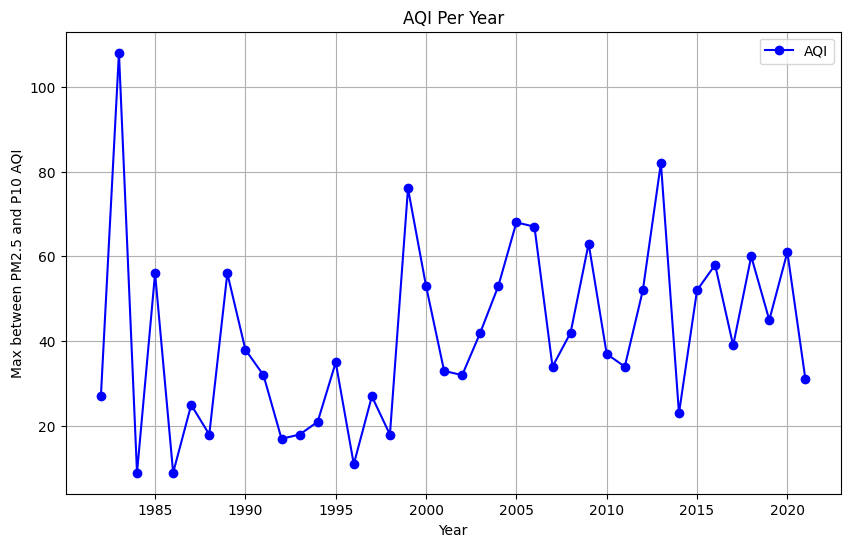

In [195]:
plt.figure(figsize=(10, 6))
plt.plot(aqi_df["Year"], aqi_df["Max_AQI_Wildfire"], marker='o', linestyle='-', color='b', label='AQI')
plt.title("AQI Per Year")
plt.xlabel("Year")
plt.ylabel("Max between PM2.5 and P10 AQI")
plt.legend()
plt.grid(True)
plt.show()


## Predictive Model
### ChatGPT Generated Code
### Time Series Modeling for Smoke Impact Forecasting
Prompt: Using `aqi_df`, I want to predict the future smoke impact trends for 2024-2025 using a time series model. Which do you recommend? It was further prompted with questions on how to implement it after viewing the correlation/significance.


To get a sense of what smoke impact might look like in the coming years, I used a time series model based on historical data. Time series forecasting is helpful here because it lets us use patterns from past years to make predictions for the future. In this case, it’s specifically helpful for understanding possible future smoke impacts due to wildfires near Gresham, OR.

### Model Selection and Scaling

For this forecast, I went with an **ARIMA model** (AutoRegressive Integrated Moving Average) with parameters `(1,1,1)`, which works well for time-based data like this. Because our smoke impact values vary a lot from year to year, I scaled the data between 0 and 1. This scaling (done using MinMax scaling) keeps everything in a manageable range and helps the model produce more stable results.

### Steps in the Analysis

1. **Summing Up Annual Smoke Impact**: I started by grouping the data by year and calculating total smoke impact for each year.
2. **Scaling the Totals**: Then, I scaled these totals to fit between 0 and 1 to keep the model focused and accurate.
3. **Modeling with ARIMA**: Using the ARIMA model, I trained it on the scaled data and forecasted smoke impacts for the next 25 years (2025–2050).
4. **Bringing Values Back to Original Scale**: Finally, I scaled the predictions back to the original values so they reflect actual smoke impact levels.

### Visualization

The plot below shows both the historical smoke impact and the forecasted values for 2025 to 2050. The shaded pink area represents the confidence interval, which gives us an idea of how much variation we might expect in these predictions. Overall, this approach provides a rough outlook on what smoke impact might look like in Gresham, OR, based on past patterns.

/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_

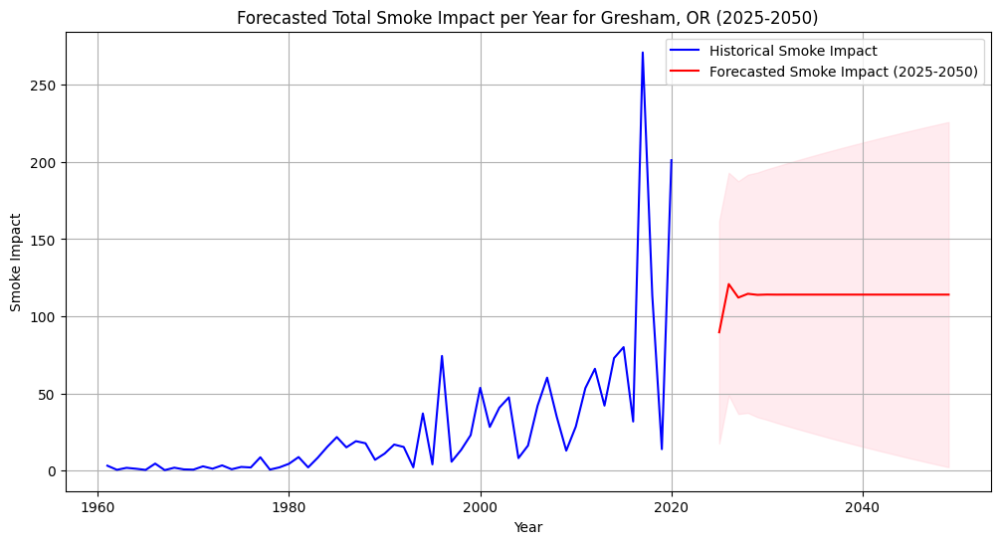

In [197]:
# Sum smoke impact by year as in the first plot
annual_smoke_impact = modified_smoke_impact_df.groupby("Year")["Smoke_Impact"].sum()

# Scale the annual summed values
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_annual_smoke_impact = scaler.fit_transform(annual_smoke_impact.values.reshape(-1, 1))

# Create a DataFrame with scaled data for ARIMA modeling
scaled_annual_df = pd.DataFrame(scaled_annual_smoke_impact, index=annual_smoke_impact.index, columns=['Scaled_Smoke_Impact'])

# Fit ARIMA model on the scaled annual summed data
arima_model = ARIMA(scaled_annual_df['Scaled_Smoke_Impact'], order=(1, 1, 1))
arima_results = arima_model.fit()

# Forecast for the next 25 years (2025 to 2050)
forecast_steps = 25
forecast = arima_results.get_forecast(steps=forecast_steps)
forecast_scaled = forecast.predicted_mean
forecast_conf_int_scaled = forecast.conf_int()

# Reverse scaling to get forecast back to original scale
forecast_unscaled = scaler.inverse_transform(forecast_scaled.values.reshape(-1, 1))
forecast_conf_int_unscaled = scaler.inverse_transform(forecast_conf_int_scaled)

# Create a DataFrame for forecasted values with years as the index
forecast_years = pd.RangeIndex(start=2025, stop=2025 + forecast_steps, step=1)
forecast_df = pd.DataFrame({
    'Forecasted_Smoke_Impact': forecast_unscaled.flatten(),
    'Lower_CI': forecast_conf_int_unscaled[:, 0],
    'Upper_CI': forecast_conf_int_unscaled[:, 1]
}, index=forecast_years)

# Plot the historical and forecasted smoke impact
plt.figure(figsize=(12, 6))
plt.plot(annual_smoke_impact.index, annual_smoke_impact.values, label="Historical Smoke Impact", color="blue")
plt.plot(forecast_df.index, forecast_df['Forecasted_Smoke_Impact'], label="Forecasted Smoke Impact (2025-2050)", color="red")
plt.fill_between(forecast_df.index, forecast_df['Lower_CI'], forecast_df['Upper_CI'], color='pink', alpha=0.3)
plt.xlabel("Year")
plt.ylabel("Smoke Impact")
plt.title("Forecasted Total Smoke Impact per Year for Gresham, OR (2025-2050)")
plt.legend()
plt.grid(True)
plt.show()

### Interpretation of Model
Good Fit: The significant p-values for ar.L1 and ma.L1 indicate the model terms are relevant. Additionally, the low sigma2 implies that the residual variance is small, suggesting the model captures the data's trend fairly well.

Residual Analysis: The heteroskedasticity and non-normal residuals suggest there might be structure in the data that the model hasn’t fully captured. This could affect prediction accuracy, especially for long-term forecasts.


In [279]:
print(arima_results.summary())

                                SARIMAX Results                                
Dep. Variable:     Scaled_Smoke_Impact   No. Observations:                   60
Model:                  ARIMA(1, 1, 1)   Log Likelihood                  33.606
Date:                 Wed, 30 Oct 2024   AIC                            -61.212
Time:                         23:28:35   BIC                            -54.979
Sample:                              0   HQIC                           -58.779
                                  - 60                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3515      0.164     -2.140      0.032      -0.673      -0.030
ma.L1         -0.6041      0.127     -4.740      0.000      -0.854      -0.354
sigma2         0.0184      0.004      4.716 

### Adjusting the Model: Normality and Heteroskedasticity 
To address heteroskedasticity and normality issues in my ARIMA model, I applied the following:

- Log Transformation: Applying np.log1p (natural log of 1 + x) stabilizes the variance, which can help with heteroskedasticity.
- Scaling: MinMax scaling is used to ensure the data is in a range suitable for the ARIMA model.
- Residual Analysis using :
1. QQ Plot: Checks if residuals follow a normal distribution.
2. ARCH Test: Tests for heteroskedasticity in residuals. If the p-value is small (<0.05), residuals may still exhibit heteroskedasticity.



/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.
  self._init_dates(dates, freq)
/Users/sarahnguyen/Library/Python/3.9/lib/python/site-packages/statsmodels/tsa/base/tsa_

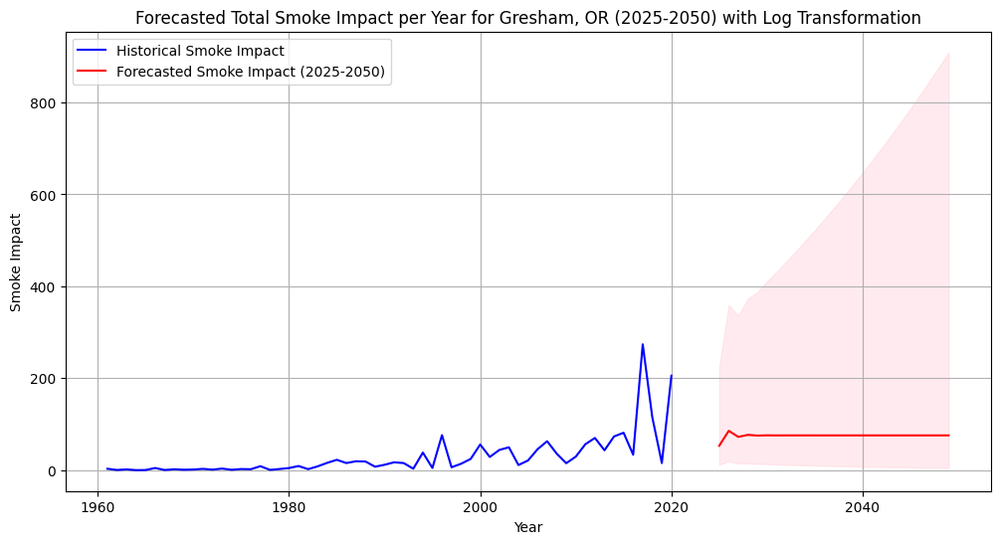

<Figure size 800x600 with 0 Axes>

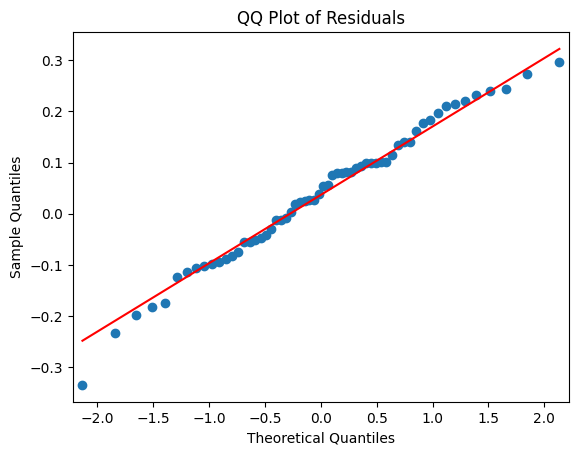

ARCH Test for Heteroskedasticity:
Test Statistic: 6.499321666853697, p-value: 0.7717145675123136
If p-value < 0.05, heteroskedasticity is likely present.


In [271]:
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.diagnostic import het_arch
import matplotlib.pyplot as plt

# Log-transform smoke impact data to stabilize variance (if values are positive)
annual_smoke_impact = modified_smoke_impact_df.groupby("Year")["Smoke_Impact"].sum()
annual_smoke_impact_log = np.log1p(annual_smoke_impact)  # Use log1p to handle zero values

# Scale the log-transformed data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_annual_smoke_impact = scaler.fit_transform(annual_smoke_impact_log.values.reshape(-1, 1))

# Create DataFrame for modeling
scaled_annual_df = pd.DataFrame(scaled_annual_smoke_impact, index=annual_smoke_impact.index, columns=['Scaled_Smoke_Impact'])

# Fit ARIMA model on the scaled data
arima_model = ARIMA(scaled_annual_df['Scaled_Smoke_Impact'], order=(1, 1, 1))
arima_results = arima_model.fit()

# Forecast for the next 25 years (2025 to 2050)
forecast_steps = 25
forecast = arima_results.get_forecast(steps=forecast_steps)
forecast_scaled = forecast.predicted_mean
forecast_conf_int_scaled = forecast.conf_int()

# Reverse scaling and log transformation to get forecast back to original scale
forecast_unscaled = scaler.inverse_transform(forecast_scaled.values.reshape(-1, 1))
forecast_conf_int_unscaled = scaler.inverse_transform(forecast_conf_int_scaled)
forecast_unscaled_exp = np.expm1(forecast_unscaled)  # Reverse log1p transformation
forecast_conf_int_unscaled_exp = np.expm1(forecast_conf_int_unscaled)

# Prepare forecast DataFrame
forecast_years = pd.RangeIndex(start=2025, stop=2025 + forecast_steps, step=1)
forecast_df = pd.DataFrame({
    'Forecasted_Smoke_Impact': forecast_unscaled_exp.flatten(),
    'Lower_CI': forecast_conf_int_unscaled_exp[:, 0],
    'Upper_CI': forecast_conf_int_unscaled_exp[:, 1]
}, index=forecast_years)

# Plot the historical and forecasted smoke impact
plt.figure(figsize=(12, 6))
plt.plot(annual_smoke_impact.index, annual_smoke_impact.values, label="Historical Smoke Impact", color="blue")
plt.plot(forecast_df.index, forecast_df['Forecasted_Smoke_Impact'], label="Forecasted Smoke Impact (2025-2050)", color="red")
plt.fill_between(forecast_df.index, forecast_df['Lower_CI'], forecast_df['Upper_CI'], color='pink', alpha=0.3)
plt.xlabel("Year")
plt.ylabel("Smoke Impact")
plt.title("Forecasted Total Smoke Impact per Year for Gresham, OR (2025-2050) with Log Transformation")
plt.legend()
plt.grid(True)
plt.show()

# Residual diagnostics
residuals = arima_results.resid

# Plot QQ plot for normality check
plt.figure(figsize=(8, 6))
qqplot(residuals, line='s')
plt.title("QQ Plot of Residuals")
plt.show()

# Heteroskedasticity Test (ARCH test)
arch_test = het_arch(residuals)
print("ARCH Test for Heteroskedasticity:")
print(f"Test Statistic: {arch_test[0]}, p-value: {arch_test[1]}")
print("If p-value < 0.05, heteroskedasticity is likely present.")


### Forecast Plot:
The forecast for smoke impact from 2025 to 2050 shows a stable, flat trend. The shaded 95% confidence interval grows wider over time, reflecting increased uncertainty. The flat trend might result from the log transformation, which helped stabilize the data. To capture more potential changes, adding seasonal or external factors could be useful.

### QQ Plot of Residuals:
The QQ plot aligns well with the red line, suggesting the residuals are mostly normal, which supports a good model fit. There’s slight deviation at the tails, but overall, it looks solid for the ARIMA model.

### ARCH Test for Heteroskedasticity:
With a p-value of 0.771 (well above 0.05), the ARCH test shows no heteroskedasticity in residuals, meaning variance is stable, which is ideal.

### Summary:
- **Residual stability**: Normal and stable residuals support the model’s reliability.
- **Forecast trend**: The forecast remains steady. To add variability, consider including seasonal or other relevant features.

### Predictive Model Results


In [272]:
print(arima_results.summary())

                                SARIMAX Results                                
Dep. Variable:     Scaled_Smoke_Impact   No. Observations:                   60
Model:                  ARIMA(1, 1, 1)   Log Likelihood                  33.606
Date:                 Wed, 30 Oct 2024   AIC                            -61.212
Time:                         22:06:58   BIC                            -54.979
Sample:                              0   HQIC                           -58.779
                                  - 60                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3515      0.164     -2.140      0.032      -0.673      -0.030
ma.L1         -0.6041      0.127     -4.740      0.000      -0.854      -0.354
sigma2         0.0184      0.004      4.716 

# Step 2: Visualize aspects of your analysis
I am illustrating the work of my analysis with a few time series graphs. The wildfire data is annual, so my time series will be on an annual basis. All the time series should cover the analysis range defined above, but not the prediction range.
- Produce a histogram showing the number of fires occurring every 50 mile distance from  assigned city for all fires ranging up to 1800 miles away from your assigned city. My histogram indicates the distance cut-off for your modeling work as specified in Step 1.
- Produce a time series graph of total acres burned per year for the fires occurring in the specified distance from your city.
- Produce a time series graph containing your fire smoke estimates for your city and the AQI estimates for your city.


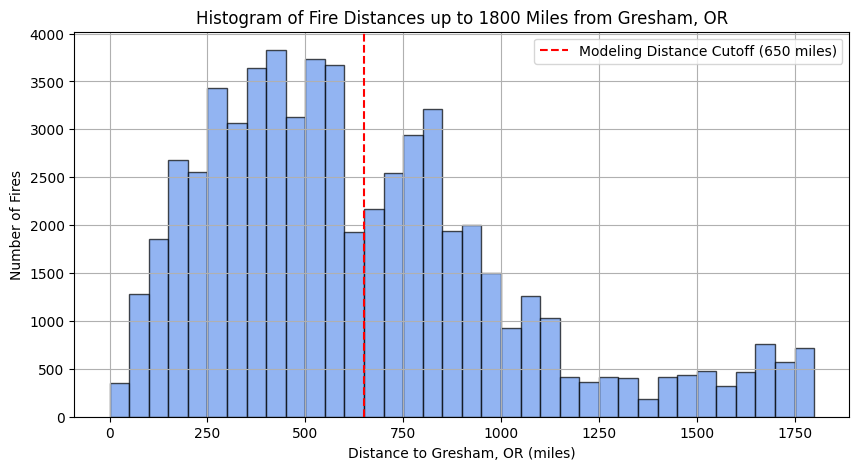

In [267]:
# using whole smoke_impact_df
distance_bins = range(0, 1850, 50)
fire_distances = smoke_impact_df["Distance_to_City_Miles"]
fire_distances_filtered = fire_distances[fire_distances <= 1800]

plt.figure(figsize=(10, 5))
plt.hist(fire_distances_filtered, bins=distance_bins, color = 'cornflowerblue', edgecolor='black', alpha=0.7)
plt.axvline(x=650, color='red', linestyle='--', label="Modeling Distance Cutoff (650 miles)")
plt.xlabel("Distance to Gresham, OR (miles)")
plt.ylabel("Number of Fires")
plt.title("Histogram of Fire Distances up to 1800 Miles from Gresham, OR")
plt.legend()
plt.grid(True)
plt.show()


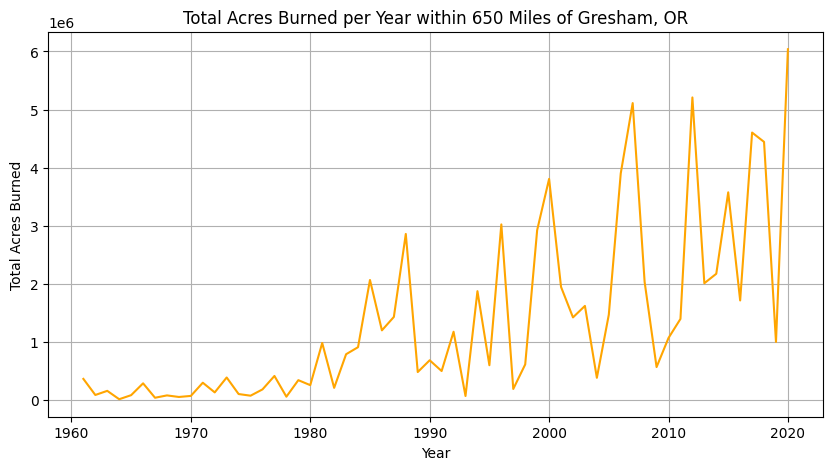

In [257]:
# this time we filter for fires within 650 miles
filtered_fires = smoke_impact_df[smoke_impact_df["Distance_to_City_Miles"] <= 650]

# group by Year and sum up acres
acres_burned_per_year = filtered_fires.groupby("Year")["Fire_Size_Acres"].sum()

plt.figure(figsize=(10, 5))
plt.plot(acres_burned_per_year.index, acres_burned_per_year.values, color="orange")
plt.xlabel("Year")
plt.ylabel("Total Acres Burned")
plt.title("Total Acres Burned per Year within 650 Miles of Gresham, OR")
plt.grid(True)
plt.show()

### Why Scale Smoke Impact and AQI?

Scaling both smoke impact and AQI values helps make them easier to compare visually:

1. **Consistent Range for Comparison**: Smoke impact and AQI might operate on different scales, so scaling them to [0, 1] allows us to put them on the same graph and see trends side-by-side.

2. **Focus on Patterns**: Scaling shifts the focus from raw values to patterns and relative changes. This way, we can more easily spot if peaks in smoke impact align with spikes in AQI, hinting at a connection.

3. **Clearer Interpretation**: With scaling, we can focus on whether the trends in both metrics move together over time, without one metric’s larger range overshadowing the other.

Overall, scaling makes the comparison between smoke impact and AQI trends clear and straightforward.


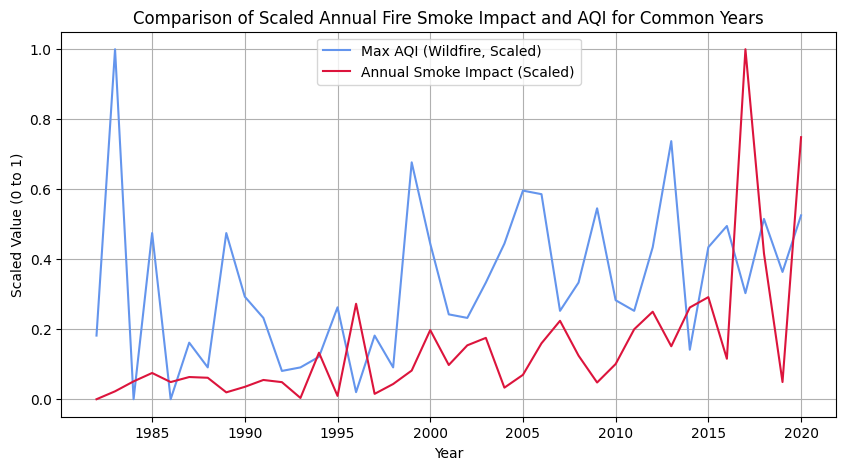

In [265]:
# The goal is to compute the annual smoke impact by summing the smoke impact for each year

# filter to include only common years between the two DataFrames
common_years = set(aqi_df['Year']).intersection(set(modified_smoke_impact_df['Year']))

aqi_filtered = aqi_df[aqi_df['Year'].isin(common_years)]
smoke_impact_filtered = modified_smoke_impact_df[modified_smoke_impact_df['Year'].isin(common_years)]

# sum smoke impacts by year for smoke_impact_filtered
annual_smoke_impact = smoke_impact_filtered.groupby('Year')['Smoke_Impact'].sum()

aqi_filtered.set_index('Year', inplace=True)
annual_smoke_impact = annual_smoke_impact.sort_index()  # Ensuring years are sorted

aqi_series = aqi_filtered['Max_AQI_Wildfire']
smoke_impact_series = annual_smoke_impact

# scale both series to range [0, 1]
scaler = MinMaxScaler()
aqi_scaled = scaler.fit_transform(aqi_series.values.reshape(-1, 1)).flatten()
smoke_impact_scaled = scaler.fit_transform(smoke_impact_series.values.reshape(-1, 1)).flatten()

plt.figure(figsize=(10, 5))
plt.plot(aqi_series.index, aqi_scaled, label="Max AQI (Wildfire, Scaled)", color="cornflowerblue")
plt.plot(smoke_impact_series.index, smoke_impact_scaled, label="Annual Smoke Impact (Scaled)", color="crimson")
plt.xlabel("Year")
plt.ylabel("Scaled Value (0 to 1)")
plt.title("Comparison of Scaled Annual Fire Smoke Impact and AQI for Common Years")
plt.legend()
plt.grid(True)
plt.show()
